In [53]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [54]:
import pandas as pd
import numpy as np
import folium
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error,r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


# EXPLORATION


### Chargement des données

In [55]:
data = pd.read_csv("airbnb_train.csv")
data.head()

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,last_review,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,zipcode,bedrooms,beds
0,5708593,4.317488,House,Private room,"{TV,""Wireless Internet"",Kitchen,""Free parking ...",3,1.0,Real Bed,flexible,False,...,NaN,33.782712,-118.134410,Island style Spa Studio,Long Beach,0,NaN,90804,0.0,2.0
1,14483613,4.007333,House,Private room,"{""Wireless Internet"",""Air conditioning"",Kitche...",4,2.0,Real Bed,strict,False,...,2017-09-17,40.705468,-73.909439,"Beautiful and Simple Room W/2 Beds, 25 Mins to...",Ridgewood,38,86.0,11385,1.0,2.0
2,10412649,7.090077,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",6,2.0,Real Bed,flexible,False,...,NaN,38.917537,-77.031651,2br/2ba luxury condo perfect for infant / toddler,U Street Corridor,0,NaN,20009,2.0,2.0
3,17954362,3.555348,House,Private room,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1,1.0,Real Bed,flexible,True,...,2017-09-29,40.736001,-73.924248,Manhattan view from Queens. Lovely single room .,Sunnyside,19,96.0,11104,1.0,1.0
4,9969781,5.480639,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,moderate,True,...,2017-08-28,37.744896,-122.430665,Zen Captured Noe Valley House,Noe Valley,15,96.0,94131,2.0,2.0


## Affichage d'une carte interactive

In [56]:
# Conversion du log_price en prix réel
data['price'] = np.exp(data['log_price'])

# Fonction pour déterminer la couleur des marqueurs selon le prix
def price_color(price):
     # Vert pour les prix inférieurs à 100
    if price < 100:
        return 'green'
    # Orange pour les prix entre 100 et 200
    elif price < 200:
        return 'orange'
    # Rouge pour les prix supérieurs à 200
    else:
        return 'red'

In [57]:
# Création d'une carte centrée sur les moyennes de latitude et longitude
map_center = [data['latitude'].mean(), data['longitude'].mean()]
map = folium.Map(location=map_center, zoom_start=10)

# Ajout des marqueurs à la carte
for idx, row in data.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=price_color(row['price']),
        fill=True,
        fill_color=price_color(row['price']),
        fill_opacity=0.7
    ).add_to(map)

# Affichage de la carte dans le notebook
map
#Ce code va créer une carte interactive, affichant les logements Airbnb avec des marqueurs de différentes couleurs selon les prix.

Grâce à la carte nous pouvons nous rendre compte quelles sont les villes prises en compte par le fichier train pour plus tard pouvoir calculer les distances par rapport aux centre-villes de ces dernières. De plus, la carte nous permet de voir l'impact de la localisation du airbnb sur le prix (proche de la mer, du centre-ville, d'un parc...).

## Relation entre le prix et le type de location

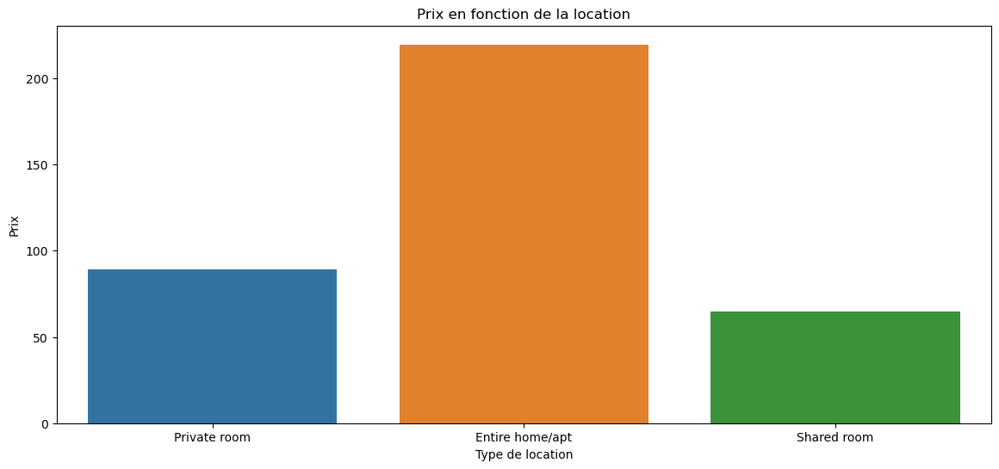

In [58]:
plt.figure(figsize=(14, 6))
sns.barplot(x=data['room_type'], y=data['price'], ci=None)
plt.title('Prix en fonction de la location')
plt.xlabel('Type de location')
plt.ylabel('Prix')
plt.show()

On voit que le type de location influence le prix du Airbnb.

## Relation entre le prix et la capacité d'accueil


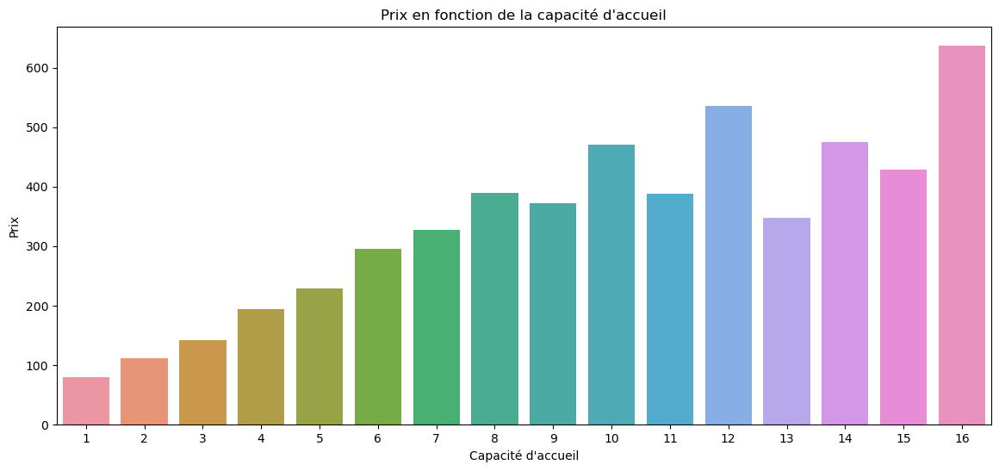

In [59]:
plt.figure(figsize=(14, 6))
sns.barplot(x=data['accommodates'], y=data['price'], ci=None)
plt.title('Prix en fonction de la capacité d\'accueil')
plt.xlabel('Capacité d\'accueil')
plt.ylabel('Prix')
plt.show()

La capacité d'accueil a un vrai impact sur le prix de la location. 

## Relation entre le prix et les notes 

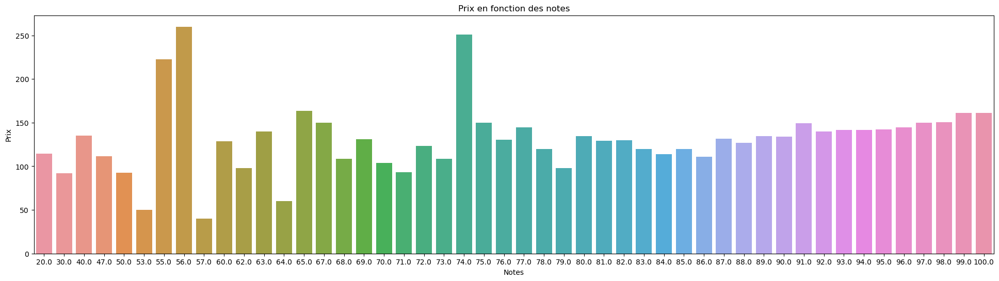

In [60]:
plt.figure(figsize=(24, 6))
sns.barplot(x=data['review_scores_rating'], y=data['price'], ci=None)
plt.title('Prix en fonction des notes' )
plt.xlabel('Notes')
plt.ylabel('Prix')
plt.show()

On remarque que les notes n'ont pas beaucoup d'impact sur le prix.

# Features Engineering

### Encodage

In [61]:
# Fonction pour vérifier la présence d'un équipement spécifique dans la colonne 'amenities'
def has_feature(amenities, feature):
    return feature in amenities

def encode(data):
    # Initialiser l'encodeur
    encoder = LabelEncoder()

    # Encoder les types de propriété, les types de chambre, et les types de lit
    data['property_type_encoded'] = encoder.fit_transform(data['property_type'])
    data['room_type_encoded'] = encoder.fit_transform(data['room_type'])
    data['bed_type_encoded'] = encoder.fit_transform(data['bed_type'])

    # Encoder la colonne 'neighbourhood' et les colonnes en référence au host
    data['neighbourhood_encoded'] = encoder.fit_transform(data['neighbourhood'])
    data['city_encoded'] = encoder.fit_transform(data['city'])
    data['cancellation_encoded'] = encoder.fit_transform(data['cancellation_policy'])
    data['host_since_encoded'] = encoder.fit_transform(data['host_since'])
    data['instant_bookable_encoded'] = encoder.fit_transform(data['instant_bookable'])
    data['host_verified'] = encoder.fit_transform(data['host_identity_verified'])

    # Extraire les différents aménagements du logement pour vérifier leur importance
    data['has_tv'] = data['amenities'].apply(lambda x: has_feature(x, 'TV'))
    data['has_wifi'] = data['amenities'].apply(lambda x: has_feature(x, 'Wireless Internet'))
    data['has_kitchen'] = data['amenities'].apply(lambda x: has_feature(x, 'Kitchen'))
    data['has_air'] = data['amenities'].apply(lambda x: has_feature(x, 'Air conditioning'))
    data['has_heating'] = data['amenities'].apply(lambda x: has_feature(x, 'Heating'))
    data['has_pool'] = data['amenities'].apply(lambda x: has_feature(x, 'Pool'))
    data['has_breakfast'] = data['amenities'].apply(lambda x: has_feature(x, 'Breakfast'))
    data['kid_friendly'] = data['amenities'].apply(lambda x: has_feature(x, 'kid friendly'))

    return data
encode(data)
print(data[['property_type', 'property_type_encoded', 'room_type', 'room_type_encoded',
            'bed_type', 'bed_type_encoded','city','city_encoded','neighbourhood', 'neighbourhood_encoded', 'amenities','has_heating','has_pool','has_breakfast','has_tv', 'has_wifi']].head())

  property_type  property_type_encoded        room_type  room_type_encoded  \
0         House                     16     Private room                  1   
1         House                     16     Private room                  1   
2     Apartment                      0  Entire home/apt                  0   
3         House                     16     Private room                  1   
4         House                     16  Entire home/apt                  0   

   bed_type  bed_type_encoded city  city_encoded      neighbourhood  \
0  Real Bed                 4   LA             3         Long Beach   
1  Real Bed                 4  NYC             4          Ridgewood   
2  Real Bed                 4   DC             2  U Street Corridor   
3  Real Bed                 4  NYC             4          Sunnyside   
4  Real Bed                 4   SF             5         Noe Valley   

   neighbourhood_encoded                                          amenities  \
0                    284 

### Nouvelle colonne : min_dist_to_closest_city

Nous avons décide de créer une nouvelle variable : la distance entre le centre ville le plus proche. On prend donc les colonnes latitude et longitude pour créer une nouvelle colonne.

In [62]:
# Coordonnées des centres de ville
city_centers = {
    'San Jose': (37.3382, -121.8863),
    'New York': (40.7128, -74.0060),
    'Los Angeles': (34.0522, -118.2437),
    'Chicago': (41.8781, -87.6298),
    'Washington': (38.9072, -77.0369)
}

# Fonction pour calculer la distance euclidienne
def euclidean_distance(lat1, lon1, lat2, lon2):
    return np.sqrt((lat1 - lat2)**2 + (lon1 - lon2)**2)
# Fonction principale
def calculate_distances(data):
    # Calcul des distances pour chaque ville
    for city, (lat, lon) in city_centers.items():
        data[f'dist_to_{city}'] = euclidean_distance(data['latitude'], data['longitude'], lat, lon)

    # Identifier la ville la plus proche
    data['closest_city'] = data[['dist_to_' + city for city in city_centers]].idxmin(axis=1).str.replace('dist_to_', '')

    # Convertir le nom de la ville en distance minimale pour la corrélation
    data['min_dist_to_closest_city'] = data.apply(lambda row: row['dist_to_' + row['closest_city']], axis=1)

    return data

calculate_distances(data)

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,has_pool,has_breakfast,kid_friendly,dist_to_San Jose,dist_to_New York,dist_to_Los Angeles,dist_to_Chicago,dist_to_Washington,closest_city,min_dist_to_closest_city
0,5708593,4.317488,House,Private room,"{TV,""Wireless Internet"",Kitchen,""Free parking ...",3,1.0,Real Bed,flexible,False,...,False,False,False,5.168963,44.669259,0.290806,31.560522,41.415767,Los Angeles,0.290806
1,14483613,4.007333,House,Private room,"{""Wireless Internet"",""Air conditioning"",Kitche...",4,2.0,Real Bed,strict,False,...,False,False,True,48.094882,0.096839,44.830711,13.770380,3.607600,New York,0.096839
2,10412649,7.090077,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",6,2.0,Real Bed,flexible,False,...,False,False,True,44.882445,3.518172,41.498247,11.003895,0.011593,Washington,0.011593
3,17954362,3.555348,House,Private room,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",1,1.0,Real Bed,flexible,True,...,False,True,True,48.082258,0.084981,44.820610,13.753056,3.610141,New York,0.084981
4,9969781,5.480639,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,moderate,True,...,False,True,True,0.679511,48.515530,5.582713,35.045450,45.408643,San Jose,0.679511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22229,11989532,4.605170,Apartment,Private room,{},1,1.0,Real Bed,flexible,False,...,False,False,False,48.065239,0.066702,44.801606,13.740220,3.583441,New York,0.066702
22230,20652462,5.043425,Apartment,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,2.0,Real Bed,moderate,True,...,False,False,True,4.919298,44.914135,0.236318,31.790993,41.664582,Los Angeles,0.236318
22231,12380210,5.220356,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",5,1.0,Real Bed,moderate,True,...,False,False,True,48.062114,0.063910,44.798328,13.737453,3.579727,New York,0.063910
22232,19533966,5.273000,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",2,1.0,Real Bed,strict,True,...,False,False,False,48.006718,0.026390,44.745929,13.677199,3.546208,New York,0.026390


## Matrice de Corrélation

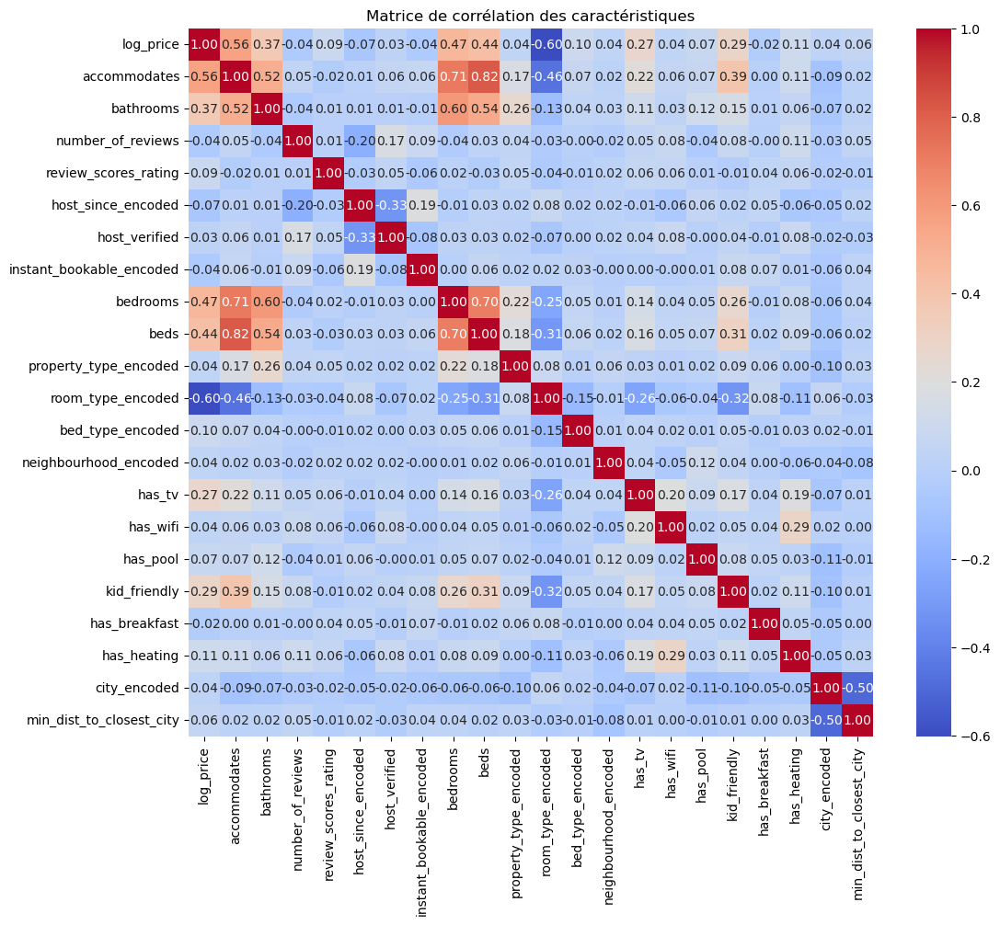

In [63]:
# Sélection des colonnes numériques pour la corrélation
numeric_columns = ['log_price', 'accommodates', 'bathrooms', 'number_of_reviews', 'review_scores_rating','host_since_encoded','host_verified','instant_bookable_encoded',
                   'bedrooms', 'beds', 'property_type_encoded', 'room_type_encoded', 
                   'bed_type_encoded', 'neighbourhood_encoded', 'has_tv','has_wifi','has_pool','kid_friendly','has_breakfast','has_heating','city_encoded','min_dist_to_closest_city']

# Calculer la matrice de corrélation
correlation_matrix = data[numeric_columns].corr()

# Visualisation de la matrice de corrélation avec Seaborn
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Matrice de corrélation des caractéristiques')
plt.show()

On remarque que la localisation et les reviews du airbnb influencent très peu le prix. Ces résultats nous surprennent mais nous décidons tout de même de ne pas les prendre en compte pour le reste du projet. 
Les colonnes que nous gardons pour déduire le prix sont donc celles qui ont le plus d'impact : 
- beds
- bedrooms
- accomodates
- bathrooms
- room type
- kid friendly

Nous avons finalement décidé de rajouter plus de colonnes pour augmenter nos resultats de test (resultat V1 vs resultat V2).

## Nouveau tableau de données

On enlève les colonnes qui ne nous sont plus nécessaires.

In [64]:
new_data_V1 = data[['log_price','beds', 'bedrooms', 'accommodates','bathrooms','room_type_encoded','kid_friendly']]
new_data_V2 =data[['log_price','beds', 'bedrooms', 'accommodates','bathrooms','room_type_encoded','city_encoded','has_tv','has_heating','neighbourhood_encoded','has_breakfast','min_dist_to_closest_city','bed_type_encoded','review_scores_rating','has_pool','kid_friendly','has_wifi']]

In [65]:
print(f'new_data_V1 taille: {new_data_V1.shape[0]}')
print(f'R2 new_data_V2 taille: {new_data_V2.shape[0]}')

new_data_V1 taille: 22234
R2 new_data_V2 taille: 22234


#### On encode les lignes qui ont une colonne vide (en remplacant NaN par 0)

In [66]:
encodage_manquant = 0
colonnes_interet = new_data_V1.columns
new_data_copy = new_data_V1.copy()
new_data_copy.loc[:, colonnes_interet] = new_data_copy.loc[:, colonnes_interet].fillna(encodage_manquant)
new_data_V1=new_data_copy

colonnes_interet = new_data_V2.columns
new_data_copy = new_data_V2.copy()
new_data_copy.loc[:, colonnes_interet] = new_data_copy.loc[:, colonnes_interet].fillna(encodage_manquant)
new_data_V2=new_data_copy

In [67]:
print(f'new_data_V1 taille: {new_data_V1.shape[0]}')
print(f'R2 new_data_V2 taille: {new_data_V2.shape[0]}')

new_data_V1 taille: 22234
R2 new_data_V2 taille: 22234


#### Nouvelle table de données

In [68]:
new_data_V1.head()

,log_price,beds,bedrooms,accommodates,bathrooms,room_type_encoded,kid_friendly
0,4.317488,2.0,0.0,3,1.0,1,False
1,4.007333,2.0,1.0,4,2.0,1,True
2,7.090077,2.0,2.0,6,2.0,0,True
3,3.555348,1.0,1.0,1,1.0,1,True
4,5.480639,2.0,2.0,4,1.0,0,True


In [69]:
new_data_V2.head()

,log_price,beds,bedrooms,accommodates,bathrooms,room_type_encoded,city_encoded,has_tv,has_heating,neighbourhood_encoded,has_breakfast,min_dist_to_closest_city,bed_type_encoded,review_scores_rating,has_pool,kid_friendly,has_wifi
0,4.317488,2.0,0.0,3,1.0,1,3,True,False,284,False,0.290806,4,0.0,False,False,True
1,4.007333,2.0,1.0,4,2.0,1,4,False,True,410,False,0.096839,4,86.0,False,True,True
2,7.090077,2.0,2.0,6,2.0,0,2,True,True,498,False,0.011593,4,0.0,False,True,True
3,3.555348,1.0,1.0,1,1.0,1,4,True,True,472,True,0.084981,4,96.0,False,True,True
4,5.480639,2.0,2.0,4,1.0,0,5,True,True,348,True,0.679511,4,96.0,False,True,True


# ENTRAINEMENT 


## Modèles pour New_data_V1

In [70]:
y = new_data_V1['log_price']
x= new_data_V1.drop(['log_price'],axis=1)
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.1,random_state=105)
from sklearn.linear_model import LinearRegression

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

model = LinearRegression()
model.fit(X_train_scaled, y_train)

# Prédiction et évaluation
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Linear Regression :')
print(f'MSE: {mse:.4f}')
print(f'R2 Score: {r2:.4f}')
print(f'Difference R2 - MSE: {r2-mse:.4f}')
print('\n')
from sklearn.linear_model import Ridge

model = Ridge(alpha=1.0)  # Le paramètre alpha contrôle le degré de régularisation
model.fit(X_train_scaled, y_train)

# Prédiction et évaluation
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Ridge Regression :')
print(f'MSE: {mse:.4f}')
print(f'R2 Score: {r2:.4f}')
print(f'Difference R2 - MSE: {r2-mse:.4f}')
print('\n')
from sklearn.tree import DecisionTreeRegressor

model = DecisionTreeRegressor(random_state=42)
model.fit(X_train_scaled, y_train)

# Prédiction et évaluation
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Decision Tree Regressor :')
print(f'MSE: {mse:.4f}')
print(f'R2 Score: {r2:.4f}')
print(f'Difference R2 - MSE: {r2-mse:.4f}')
print('\n')
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)

# Prédiction et évaluation
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Random Forest Regressor :')
print(f'MSE: {mse:.4f}')
print(f'R2 Score: {r2:.4f}')
print(f'Difference R2 - MSE: {r2-mse:.4f}')

Linear Regression :
MSE: 0.2559
R2 Score: 0.5103
Difference R2 - MSE: 0.2544


Ridge Regression :
MSE: 0.2559
R2 Score: 0.5103
Difference R2 - MSE: 0.2544


Decision Tree Regressor :
MSE: 0.2641
R2 Score: 0.4948
Difference R2 - MSE: 0.2307


Random Forest Regressor :
MSE: 0.2523
R2 Score: 0.5172
Difference R2 - MSE: 0.2649


## Modèles pour New_data_V2

In [71]:
y = new_data_V2['log_price']
x= new_data_V2.drop(['log_price'],axis=1)
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.1,random_state=105)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

### Linear Regression

In [72]:
from sklearn.linear_model import LinearRegression
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

model = LinearRegression()
model.fit(X_train_scaled, y_train)

# Prédiction et évaluation
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse:.4f}')
print(f'R2 Score: {r2:.4f}')
print(f'Difference R2 - MSE: {r2-mse:.4f}')

MSE: 0.2322
R2 Score: 0.5558
Difference R2 - MSE: 0.3236


### Ridge Regression

In [73]:
from sklearn.linear_model import Ridge
model = Ridge(alpha=1.0)  # Le paramètre alpha contrôle le degré de régularisation
model.fit(X_train_scaled, y_train)

# Prédiction et évaluation
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse:.4f}')
print(f'R2 Score: {r2:.4f}')
print(f'Difference R2 - MSE: {r2-mse:.4f}')

MSE: 0.2322
R2 Score: 0.5558
Difference R2 - MSE: 0.3236


### Decision Tree Regressor

In [74]:
from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train_scaled, y_train)

# Prédiction et évaluation
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse:.4f}')
print(f'R2 Score: {r2:.4f}')
print(f'Difference R2 - MSE: {r2-mse:.4f}')

MSE: 0.3648
R2 Score: 0.3021
Difference R2 - MSE: -0.0626


### Random Forest Regressor

In [75]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)

# Prédiction et évaluation
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse:.4f}')
print(f'R2 Score: {r2:.4f}')
print(f'Difference R2 - MSE: {r2-mse:.4f}')

MSE: 0.1831
R2 Score: 0.6497
Difference R2 - MSE: 0.4666


### XGB Regressor

In [76]:
pip install pandas scikit-learn xgboost

In [77]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error,r2_score

# Initialisation et entraînement du modèle XGBRegressor
model = XGBRegressor()
model.fit(x_train, y_train)

# Prédiction sur l'ensemble de test
y_pred = model.predict(x_test)

# Évaluation du modèle
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse:.4f}')
print(f'R2 Score: {r2:.4f}')
print(f'Difference R2 - MSE: {r2-mse:.4f}')


MSE: 0.1648
R2 Score: 0.6846
Difference R2 - MSE: 0.5198


### Baseline

In [78]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Configuration du DummyRegressor pour prédire la moyenne des valeurs cibles
baseline_model = DummyRegressor(strategy='mean')
baseline_model.fit(X_train_scaled, y_train)

# Prédiction sur l'ensemble de test
y_pred_baseline = baseline_model.predict(X_test_scaled)

# Évaluation de la baseline
mse_baseline = mean_squared_error(y_test, y_pred_baseline)
r2_baseline = r2_score(y_test, y_pred_baseline)

print(f'Baseline MSE: {mse_baseline:.4f}')
print(f'Baseline R2 Score: {r2_baseline:.4f}')

Baseline MSE: 0.5228
Baseline R2 Score: -0.0002


## Conclusion

On voit que la V2 donne des scores de test plus élevés. Nous allons donc garder la V2 plutôt que notre V1. 

On choisit comme modele de prediction celui qui a la difference R2 - MSE la plus grande :
#### XGB Regressor
#### Notre base de données est désormais : new_data_V2

# PREDICTION

In [79]:
data=pd.read_csv('airbnb_test.csv')

In [80]:
def has_feature(amenities, feature):
    return feature in amenities

encode(data)
calculate_distances(data)

,Unnamed: 0,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,...,has_pool,has_breakfast,kid_friendly,dist_to_San Jose,dist_to_New York,dist_to_Los Angeles,dist_to_Chicago,dist_to_Washington,closest_city,min_dist_to_closest_city
0,14282777,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1.0,Real Bed,strict,True,NYC,...,False,False,True,48.012280,0.021721,44.748116,13.689272,3.532057,New York,0.021721
1,17029381,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1.0,Real Bed,strict,True,NYC,...,False,False,True,48.019768,0.055948,44.761050,13.686009,3.570016,New York,0.055948
2,7824740,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1.0,Real Bed,moderate,True,NYC,...,False,True,True,48.067950,0.113835,44.812134,13.727807,3.630565,New York,0.113835
3,19811650,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,flexible,True,SF,...,False,False,False,0.696820,48.514831,5.601393,35.043211,45.408911,San Jose,0.696820
4,12410741,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1.0,Real Bed,moderate,True,DC,...,False,False,False,44.879787,3.516586,41.496272,10.998884,0.018570,Washington,0.018570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51872,14844128,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",4,1.0,Real Bed,flexible,False,LA,...,False,False,True,4.843013,44.712803,0.104184,31.564782,41.471599,Los Angeles,0.104184
51873,16051971,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",4,1.0,Real Bed,moderate,True,NYC,...,False,True,True,48.047180,0.068838,44.788158,13.713521,3.593146,New York,0.068838
51874,16429629,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",3,1.0,Real Bed,strict,True,NYC,...,False,False,False,48.045841,0.071985,44.787257,13.711365,3.594453,New York,0.071985
51875,324969,House,Private room,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,moderate,True,LA,...,False,False,True,4.849854,44.761649,0.057435,31.618382,41.518806,Los Angeles,0.057435


In [81]:
new_data = data[['beds', 'bedrooms', 'accommodates','bathrooms','room_type_encoded','city_encoded','has_tv','has_heating','neighbourhood_encoded','has_breakfast','min_dist_to_closest_city','bed_type_encoded','review_scores_rating','has_pool','kid_friendly','has_wifi']]

In [82]:
new_data.head()

,beds,bedrooms,accommodates,bathrooms,room_type_encoded,city_encoded,has_tv,has_heating,neighbourhood_encoded,has_breakfast,min_dist_to_closest_city,bed_type_encoded,review_scores_rating,has_pool,kid_friendly,has_wifi
0,1.0,1.0,3,1.0,0,4,False,True,76,False,0.021721,4,100.0,False,True,True
1,3.0,3.0,7,1.0,0,4,False,True,247,False,0.055948,4,93.0,False,True,True
2,3.0,1.0,5,1.0,0,4,True,True,243,True,0.113835,4,92.0,False,True,True
3,2.0,2.0,4,1.0,0,5,True,True,318,False,0.696820,4,NaN,False,False,True
4,1.0,0.0,2,1.0,0,2,True,True,118,False,0.018570,4,40.0,False,False,True


In [83]:
new_data.shape[0]

51877

#### On remplace les valeurs manquantes NaN par 0

In [84]:
encodage_manquant = 0
colonnes_interet =['beds', 'bedrooms', 'accommodates','bathrooms','room_type_encoded','city_encoded','has_tv','has_heating','neighbourhood_encoded','has_breakfast','min_dist_to_closest_city','bed_type_encoded','review_scores_rating','has_pool','kid_friendly','has_wifi']
new_data_copy = new_data.copy()

# Filtrer les colonnes d'intérêt et remplacer les NaN par l'encodage spécifique
new_data_copy.loc[:, colonnes_interet] = new_data_copy.loc[:, colonnes_interet].fillna(encodage_manquant)
new_data=new_data_copy

In [85]:
new_data.shape[0]

51877

In [86]:
model = XGBRegressor()
model.fit(x_train, y_train)


# Prédire le log_price sur l'ensemble de test
y_pred = model.predict(new_data)

predicted_prices = pd.DataFrame(y_pred, columns=['Prediction Prix'])
print(predicted_prices.shape)
print(predicted_prices.head())

(51877, 1)
   Prediction Prix
0         4.999382
1         5.406502
2         4.687842
3         5.983965
4         4.991737


In [87]:
prediction_example = pd.read_csv("prediction_example.csv")
prediction_example= prediction_example.loc[new_data.index]
prediction_example["logpred"] = y_pred
print(prediction_example.shape)
print(prediction_example.head())
prediction_example.to_csv("MaPredictionFinale.csv", index=False) 

(51877, 2)
   Unnamed: 0   logpred
0    14282777  4.999382
1    17029381  5.406502
2     7824740  4.687842
3    19811650  5.983965
4    12410741  4.991737


In [88]:
def estConforme(monFichier_csv):
    votre_prediction = pd.read_csv(monFichier_csv)

    fichier_exemple = pd.read_csv("prediction_example.csv")

    assert votre_prediction.columns[1] == fichier_exemple.columns[1], f"Attention, votre colonne de prédiction doit s'appeler {fichier_exemple.columns[1]}, elle s'appelle '{votre_prediction.columns[1]}'"
    assert len(votre_prediction) == len(fichier_exemple), f"Attention, vous devriez avoir {len(fichier_exemple)} prédiction dans votre fichier, il en contient '{len(votre_prediction)}'"

    assert np.all(votre_prediction.iloc[:,0] == fichier_exemple.iloc[:, 0])

    print("Fichier conforme!")

estConforme("MaPredictionFinale.csv")

Fichier conforme!


Resultat dans le fichier MaPredictionFinale.csv

## Fin du Projet

### Merci !

Marine JOURNU

Lison LEANDRE